In [1]:
import librosa
import torch
import random
from torchaudio.datasets import LIBRISPEECH, SPEECHCOMMANDS, YESNO
from IPython.display import Audio
from torchaudio.transforms import MelScale
import matplotlib.pyplot as plt

%load_ext autoreload
%autoreload 2
%matplotlib inline
0
from dstft import DSTFT, FDSTFT
from dstft.loss import kurtosis_loss, entropy_loss, kurtosis2_loss
from dstft.optim import scale_loss

device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [3]:
dataset = SPEECHCOMMANDS(root='../../../data/raw', download=False)
i = 663
# y = None
# while y != 'backward':
#     i = random.randint(0, len(dataset))
x, sr, y, speaker_id, utterance_id = dataset[i]
print(f'{y} {x.device} | {i} | x.shape: {x.shape} | sample rate : {sr} | speaker ID: {speaker_id} | utterance ID: {utterance_id}')
Audio(x, rate=sr)

backward cpu | 663 | x.shape: torch.Size([1, 16000]) | sample rate : 16000 | speaker ID: 6565a81d | utterance ID: 3


In [4]:
x =x.to(device)

In [32]:
melscale_transform = MelScale(n_mels=128, sample_rate=sr, n_stft=501).to(device)

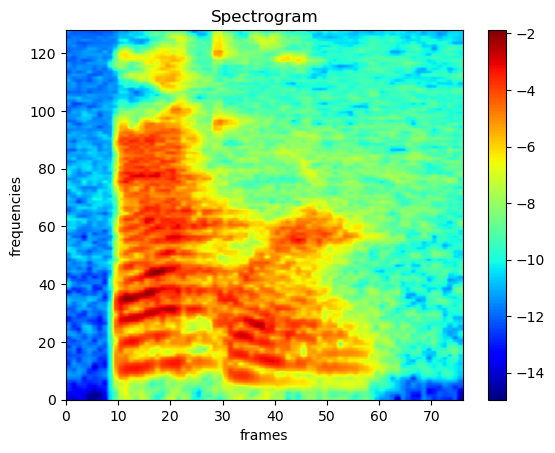

In [5]:
dstft = FDSTFT(x, win_length=600, support=1_000, stride=200, win_requires_grad=False, stride_requires_grad=False, stride_p=None, first_frame=True)
spec, *_ = dstft(x)
spec = melscale_transform(spec)
dstft.print(spec, x, weights=False, bar=True, wins=False)

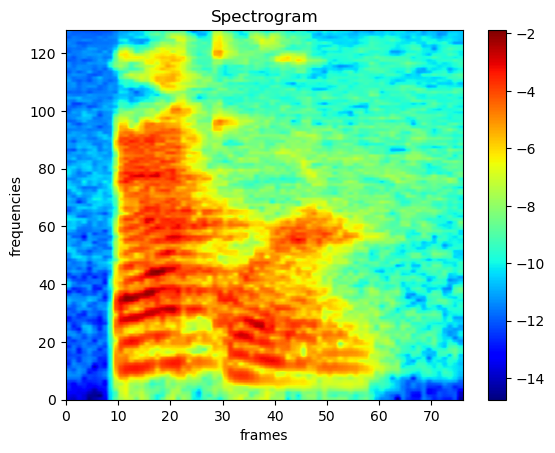

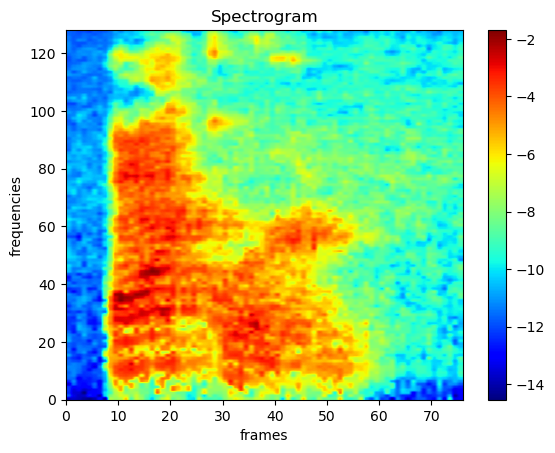

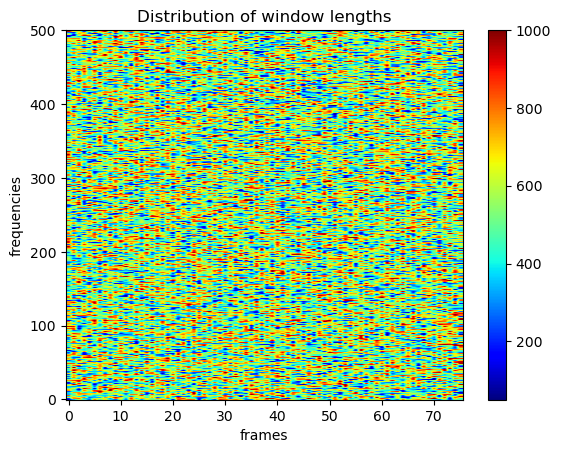

In [6]:
dstft = DSTFT(x, win_length=600, support=1_000, stride=200, win_requires_grad=False, stride_requires_grad=False, win_p='tf', stride_p=None, first_frame=True)
spec, *_ = dstft(x)
spec = melscale_transform(spec)
dstft.print(spec, x, weights=False, bar=True, wins=False)

dstft.win_length.data = dstft.win_min + dstft.win_max * torch.rand(dstft.win_length.size(), device=device)

spec, *_ = dstft(x)
spec = melscale_transform(spec)
dstft.print(spec, x, weights=True, bar=True, wins=False)


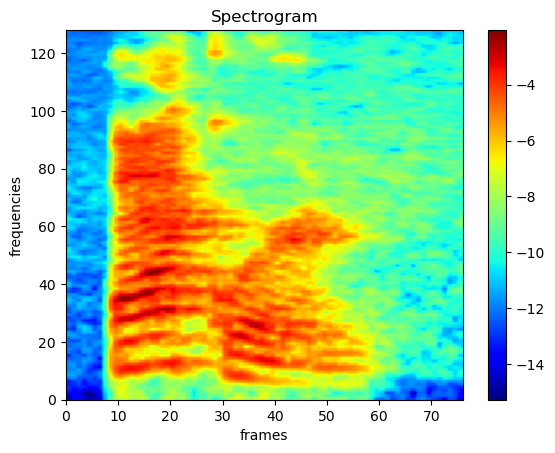

In [7]:
dstft = FDSTFT(x, win_length=826, support=1_000, stride=200, win_requires_grad=False, stride_requires_grad=False, win_p='t', stride_p=None, first_frame=True)
spec, *_ = dstft(x)
spec = melscale_transform(spec)
dstft.print(spec, x, weights=False, bar=True, wins=False)

600 tensor(7.7444, device='cuda:0')


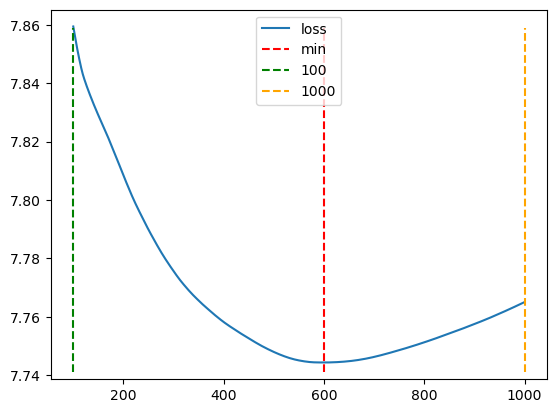

In [8]:
losses = []
min_err = 100
min_win = 0

for win_length in range(100, 1000, 1):
    dstft = FDSTFT(x, win_length=win_length, support=1_000, stride=200, win_requires_grad=False, stride_requires_grad=False, win_p=None, stride_p=None)
    spec, *_ = dstft(x)
    spec = melscale_transform(spec)
    err = entropy_loss(spec)
    
    if err < min_err:
        min_err = err
        min_win = win_length
    losses.append(err.cpu())
    
print(min_win, min_err)

plt.plot(range(100, 1000, 1), losses, label='loss')
plt.axvline(x=min_win, ymin=0.02, ymax=0.95,  color='red', linestyle ='--', label='min')
plt.axvline(x=100, ymin=0.02, ymax=0.95,  color='green', linestyle ='--', label='100')
plt.axvline(x=1000, ymin=0.02, ymax=0.95,  color='orange', linestyle ='--', label='1000')
plt.legend(loc='upper center')
plt.show()

826 tensor(20.2351, device='cuda:0')


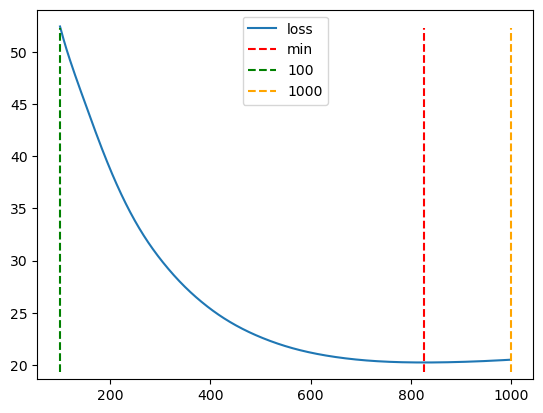

In [9]:
losses = []
min_err = 100
min_win = 0

for win_length in range(100, 1000, 1):
    dstft = FDSTFT(x, win_length=win_length, support=1_000, stride=200, win_requires_grad=False, stride_requires_grad=False, win_p=None, stride_p=None)
    spec, *_ = dstft(x)
    spec = melscale_transform(spec)
    err = 1_000 / kurtosis2_loss(spec)
    
    if err < min_err:
        min_err = err
        min_win = win_length
    losses.append(err.cpu())
    
print(min_win, min_err)

plt.plot(range(100, 1000, 1), losses, label='loss')
plt.axvline(x=min_win, ymin=0.02, ymax=0.95,  color='red', linestyle ='--', label='min')
plt.axvline(x=100, ymin=0.02, ymax=0.95,  color='green', linestyle ='--', label='100')
plt.axvline(x=1000, ymin=0.02, ymax=0.95,  color='orange', linestyle ='--', label='1000')
plt.legend(loc='upper center')
plt.show()

100 tensor(9.5929, device='cuda:0')


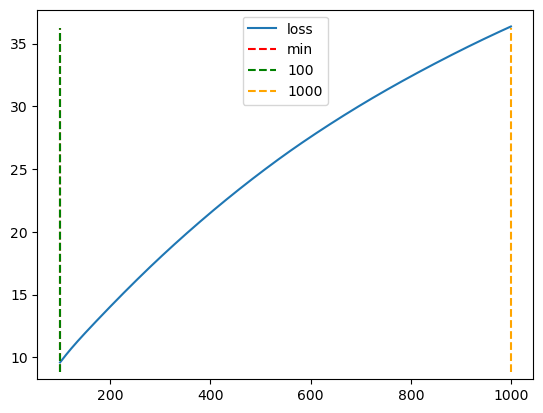

In [10]:
losses = []
min_err = 100
min_win = 0

for win_length in range(100, 1000, 1):
    dstft = FDSTFT(x, win_length=win_length, support=1_000, stride=200, win_requires_grad=False, stride_requires_grad=False, win_p=None, stride_p=None)
    spec, *_ = dstft(x)
    spec = melscale_transform(spec)
    err = 1_000 / spec.sum()
    
    if err < min_err:
        min_err = err
        min_win = win_length
    losses.append(err.cpu())
    
print(min_win, min_err)

plt.plot(range(100, 1000, 1), losses, label='loss')
plt.axvline(x=min_win, ymin=0.02, ymax=0.95,  color='red', linestyle ='--', label='min')
plt.axvline(x=100, ymin=0.02, ymax=0.95,  color='green', linestyle ='--', label='100')
plt.axvline(x=1000, ymin=0.02, ymax=0.95,  color='orange', linestyle ='--', label='1000')
plt.legend(loc='upper center')
plt.show()

Epoch 00104: reducing learning rate of group 0 to 1.0000e+01.
Epoch 00204: reducing learning rate of group 0 to 1.0000e+00.
Epoch 00304: reducing learning rate of group 0 to 1.0000e-01.
303
627.7203369140625 tensor(8.4002, device='cuda:0', grad_fn=<MeanBackward0>)


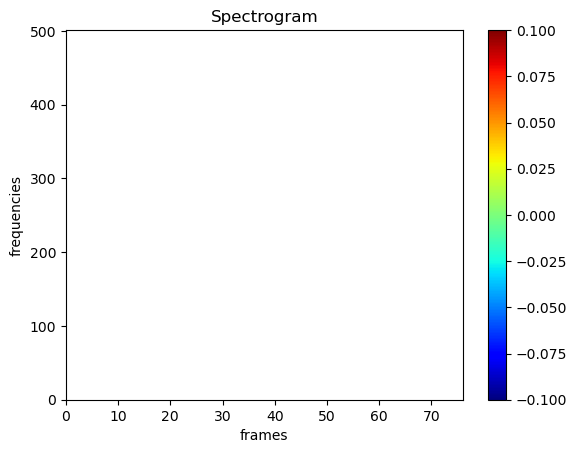

nan


In [16]:
dstft = FDSTFT(x, win_length=1_000, support=1_000, stride=200, win_requires_grad=True, stride_requires_grad=False, win_p=None, stride_p=None)
params = [{'params': dstft.win_length,    'lr': 100.0}, ] 
opt = torch.optim.Adam(params)
sch = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, mode='min', factor=.1, patience=99, verbose=True)

min_err = 100
min_win = 0

for epoch in range(1_000):
    opt.zero_grad()    
    spec, *_ = dstft(x)
    err = entropy_loss(spec)
    err.backward()    
    opt.step()
    sch.step(err)
    
    if err < min_err:
        min_err = err
        min_win = dstft.win_length.item()
    
    if opt.param_groups[0]['lr'] < 1:
        break
    
print(epoch)
print(min_win, min_err)
dstft.print(spec, x, bar=True, wins=False, weights=False)
print(f'{dstft.win_length.item():.1f}')

Epoch 00101: reducing learning rate of group 0 to 1.0000e+01.
Epoch 00201: reducing learning rate of group 0 to 1.0000e+00.
Epoch 00301: reducing learning rate of group 0 to 1.0000e-01.
300
1099.9920654296875 tensor(6.6684, device='cuda:0', grad_fn=<MulBackward0>)


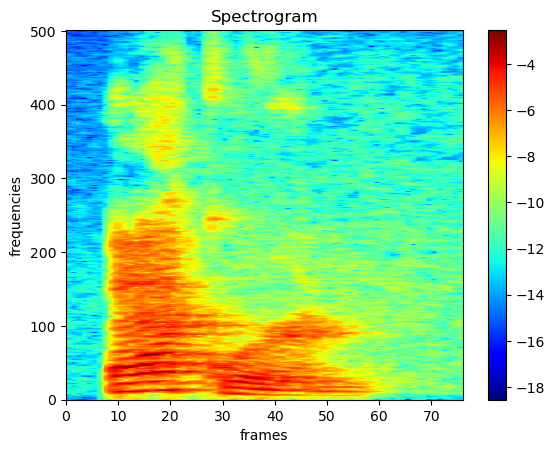

1600.4


In [12]:
dstft = FDSTFT(x, win_length=1_000, support=1_000, stride=200, win_requires_grad=True, stride_requires_grad=False, win_p=None, stride_p=None)
params = [{'params': dstft.win_length,    'lr': 100.0}, ] 
opt = torch.optim.Adam(params)
sch = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, mode='min', factor=.1, patience=99, verbose=True)

min_err = 100
min_win = 0

for epoch in range(1_000):
    opt.zero_grad()    
    spec, *_ = dstft(x)
    err = 1_000 / kurtosis2_loss(spec)
    err.backward()    
    opt.step()
    sch.step(err)
    
    if err < min_err:
        min_err = err
        min_win = dstft.win_length.item()
    
    if opt.param_groups[0]['lr'] < 1:
        break
    
print(epoch)
print(min_win, min_err)
dstft.print(spec, x, bar=True, wins=False, weights=False)
print(f'{dstft.win_length.item():.1f}')

Epoch 00111: reducing learning rate of group 0 to 1.0000e+01.
Epoch 00211: reducing learning rate of group 0 to 1.0000e+00.
Epoch 00311: reducing learning rate of group 0 to 1.0000e-01.
310
-94.36872863769531 tensor(6.6279, device='cuda:0', grad_fn=<MulBackward0>)


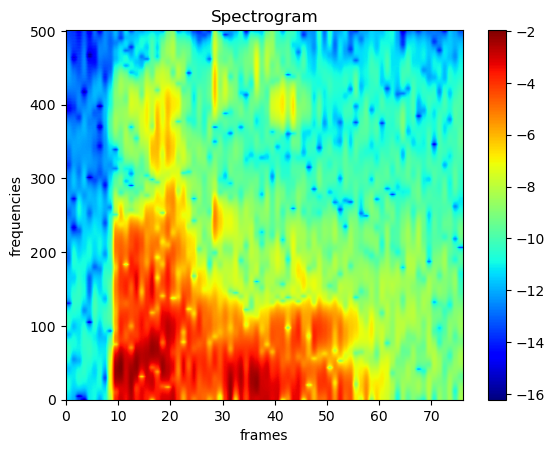

-1001.2


In [13]:
dstft = FDSTFT(x, win_length=1_000, support=1_000, stride=200, win_requires_grad=True, stride_requires_grad=False, win_p=None, stride_p=None)
params = [{'params': dstft.win_length,    'lr': 100.0}, ] 
opt = torch.optim.Adam(params)
sch = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, mode='min', factor=.1, patience=99, verbose=True)

min_err = 100
min_win = 0

for epoch in range(1_000):
    opt.zero_grad()    
    spec, *_ = dstft(x)
    err = 1_000 / spec.sum()
    err.backward()    
    opt.step()
    sch.step(err)
    
    if err < min_err:
        min_err = err
        min_win = dstft.win_length.item()
    
    if opt.param_groups[0]['lr'] < 1:
        break
    
print(epoch)
print(min_win, min_err)
dstft.print(spec, x, bar=True, wins=False, weights=False)
print(f'{dstft.win_length.item():.1f}')

Epoch 00164: reducing learning rate of group 0 to 1.0000e+01.
Epoch 00264: reducing learning rate of group 0 to 1.0000e+00.
Epoch 00364: reducing learning rate of group 0 to 1.0000e-01.
363


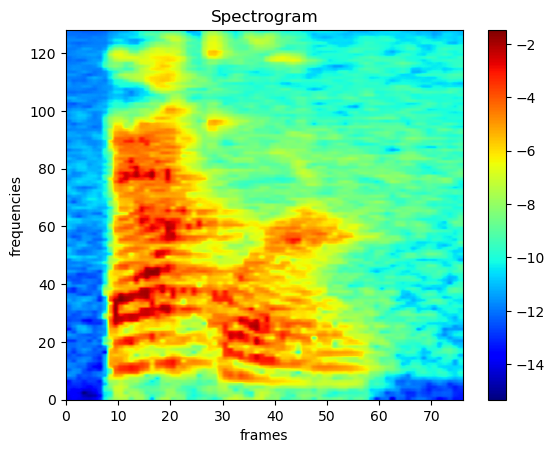

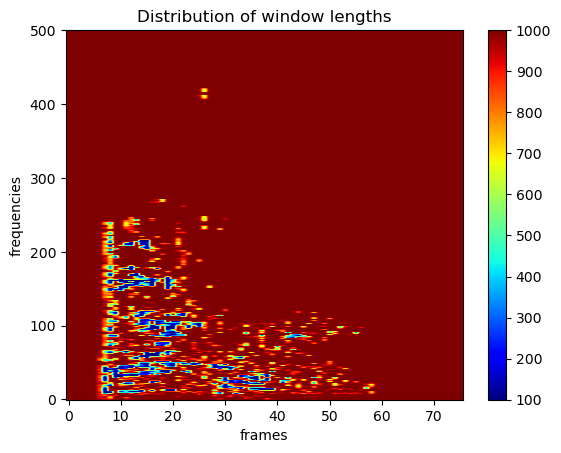

In [11]:
dstft = DSTFT(x, win_length=1_000, support=1_000, stride=200, win_requires_grad=True, stride_requires_grad=False, win_p='tf', win_min=100)
params = [{'params': dstft.win_length, 'lr': 100.0},  ] 
opt = torch.optim.Adam(params)
sch = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, mode='min', factor=.1, patience=99, verbose=True)

for epoch in range(1_000):
    opt.zero_grad()
    spec, *_ = dstft(x)
    spec = melscale_transform(spec)
    err = entropy_loss(spec) + 0.001 * (dstft.actual_win_length.diff(dim=0)[:, :-1].pow(2) + dstft.actual_win_length.diff(dim=1)[:-1].pow(2) + torch.finfo(x.dtype).eps).sqrt().mean()
    err.backward()
    opt.step()
    sch.step(err)
    
    if opt.param_groups[0]['lr'] < 1:
        break
    
print(epoch)
dstft.print(spec, x, bar=True, wins=False)

Epoch 00153: reducing learning rate of group 0 to 1.0000e+01.
Epoch 00263: reducing learning rate of group 0 to 1.0000e+00.
Epoch 00363: reducing learning rate of group 0 to 1.0000e-01.
362


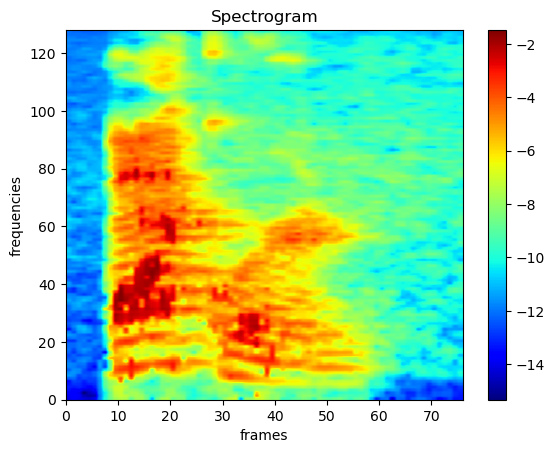

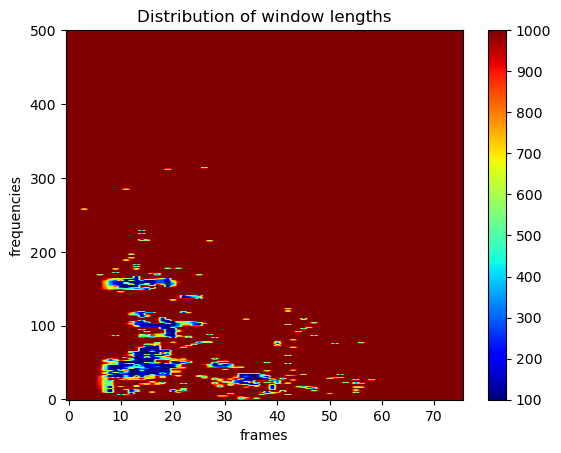

In [12]:
dstft = DSTFT(x, win_length=1_000, support=1_000, stride=200, win_requires_grad=True, stride_requires_grad=False, win_p='tf', win_min=100)
params = [{'params': dstft.win_length, 'lr': 100.0},  ] 
opt = torch.optim.Adam(params)
sch = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, mode='min', factor=.1, patience=99, verbose=True)

dstft.win_length.data = dstft.win_min + dstft.win_max * torch.rand(dstft.win_length.size(), device=dstft.win_length.device)

for epoch in range(1_000):
    opt.zero_grad()
    spec, *_ = dstft(x)
    spec = melscale_transform(spec)
    err = entropy_loss(spec) + 0.01 * (dstft.actual_win_length.diff(dim=0)[:, :-1].pow(2) + dstft.actual_win_length.diff(dim=1)[:-1].pow(2) + torch.finfo(x.dtype).eps).sqrt().mean()
    err.backward()
    opt.step()
    sch.step(err)
    
    if opt.param_groups[0]['lr'] < 1:
        break
    
print(epoch)
dstft.print(spec, x, bar=True, wins=False)

Epoch 00181: reducing learning rate of group 0 to 1.0000e+01.
Epoch 00281: reducing learning rate of group 0 to 1.0000e+00.
Epoch 00381: reducing learning rate of group 0 to 1.0000e-01.
380


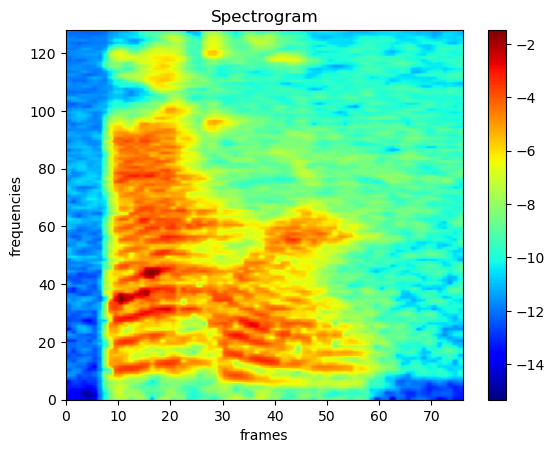

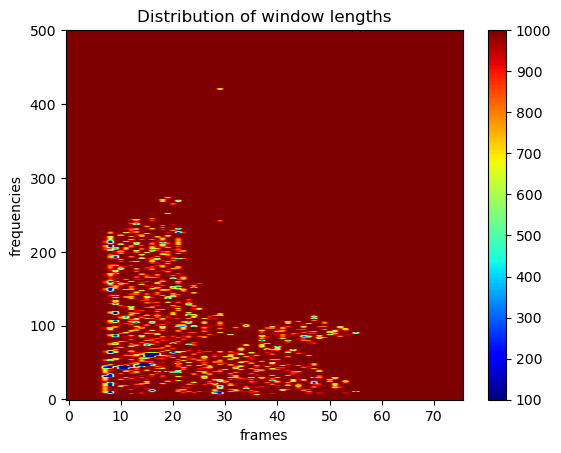

In [13]:
dstft = DSTFT(x, win_length=1_000, support=1_000, stride=200, win_requires_grad=True, stride_requires_grad=False, win_p='tf', win_min=100)
params = [{'params': dstft.win_length, 'lr': 100.0},  ] 
opt = torch.optim.Adam(params)
sch = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, mode='min', factor=.1, patience=99, verbose=True)

for epoch in range(1_000):
    opt.zero_grad()
    spec, *_ = dstft(x)
    spec = melscale_transform(spec)
    err = 1_000 / kurtosis2_loss(spec) + 0.001 * (dstft.actual_win_length.diff(dim=0)[:, :-1].pow(2) + dstft.actual_win_length.diff(dim=1)[:-1].pow(2) + torch.finfo(x.dtype).eps).sqrt().mean()
    err.backward()
    opt.step()
    sch.step(err)
    
    if opt.param_groups[0]['lr'] < 1:
        break
    
print(epoch)
dstft.print(spec, x, bar=True, wins=False)

Epoch 00313: reducing learning rate of group 0 to 1.0000e+01.
Epoch 00419: reducing learning rate of group 0 to 1.0000e+00.
Epoch 00519: reducing learning rate of group 0 to 1.0000e-01.
518


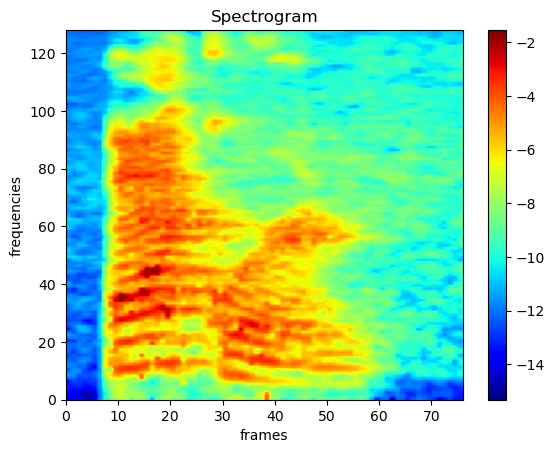

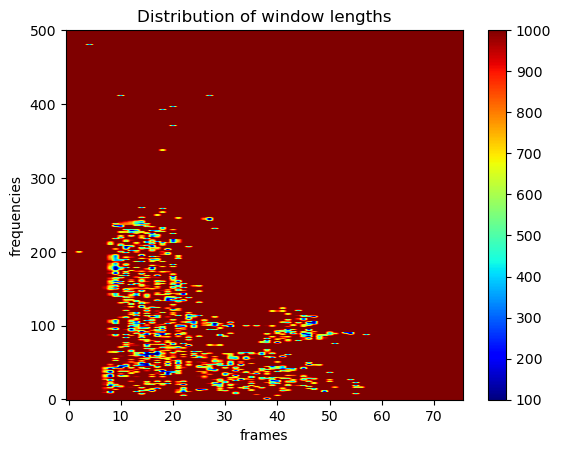

In [14]:
dstft = DSTFT(x, win_length=1_000, support=1_000, stride=200, win_requires_grad=True, stride_requires_grad=False, win_p='tf', win_min=100)
params = [{'params': dstft.win_length, 'lr': 100.0},  ] 
opt = torch.optim.Adam(params)
sch = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, mode='min', factor=.1, patience=99, verbose=True)

dstft.win_length.data = dstft.win_min + dstft.win_max * torch.rand(dstft.win_length.size(), device=dstft.win_length.device)

for epoch in range(1_000):
    opt.zero_grad()
    spec, *_ = dstft(x)
    spec = melscale_transform(spec)
    err = 1_000 / kurtosis2_loss(spec) + 0.01 * (dstft.actual_win_length.diff(dim=0)[:, :-1].pow(2) + dstft.actual_win_length.diff(dim=1)[:-1].pow(2) + torch.finfo(x.dtype).eps).sqrt().mean()
    err.backward()
    opt.step()
    sch.step(err)
    
    if opt.param_groups[0]['lr'] < 1:
        break
    
print(epoch)
dstft.print(spec, x, bar=True, wins=False)

Epoch 00169: reducing learning rate of group 0 to 1.0000e+01.
Epoch 00286: reducing learning rate of group 0 to 1.0000e+00.
Epoch 00390: reducing learning rate of group 0 to 1.0000e-01.
389


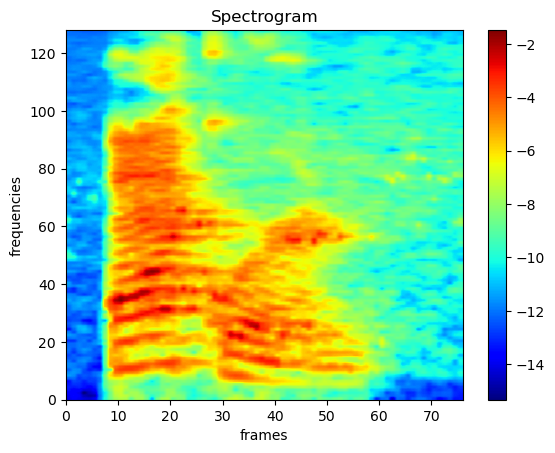

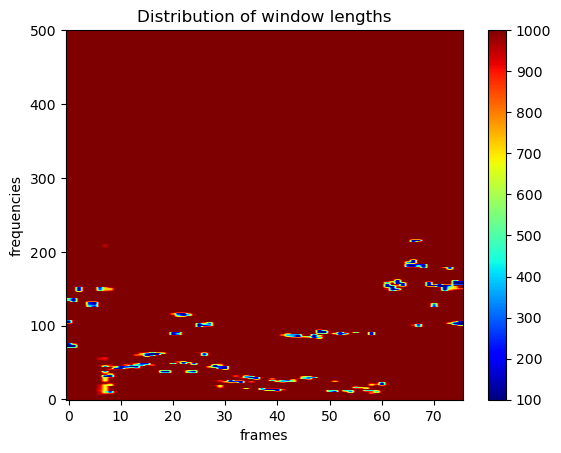

In [15]:
dstft = DSTFT(x, win_length=1_000, support=1_000, stride=200, win_requires_grad=True, stride_requires_grad=False, win_p='tf', win_min=100)
params = [{'params': dstft.win_length, 'lr': 100.0},  ] 
opt = torch.optim.Adam(params)
sch = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, mode='min', factor=.1, patience=99, verbose=True)

for epoch in range(1_000):
    opt.zero_grad()
    spec, *_ = dstft(x)
    spec = melscale_transform(spec)
    err = 1_000 / kurtosis_loss(spec).sum() + 0.01 * (dstft.actual_win_length.diff(dim=0)[:, :-1].pow(2) + dstft.actual_win_length.diff(dim=1)[:-1].pow(2) + torch.finfo(x.dtype).eps).sqrt().mean()
    err.backward()
    opt.step()
    sch.step(err)
    
    if opt.param_groups[0]['lr'] < 1:
        break
    
print(epoch)
dstft.print(spec, x, bar=True, wins=False)

Epoch 00248: reducing learning rate of group 0 to 1.0000e+01.
Epoch 00360: reducing learning rate of group 0 to 1.0000e+00.
Epoch 00460: reducing learning rate of group 0 to 1.0000e-01.
459


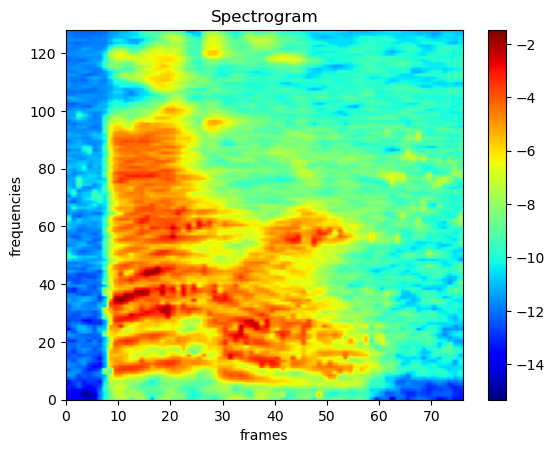

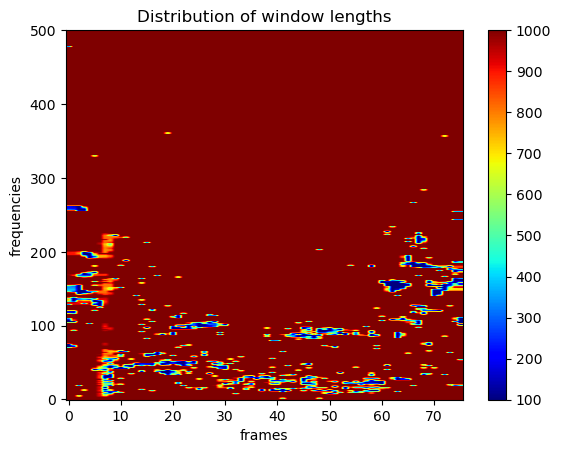

In [16]:
dstft = DSTFT(x, win_length=1_000, support=1_000, stride=200, win_requires_grad=True, stride_requires_grad=False, win_p='tf', win_min=100)
params = [{'params': dstft.win_length, 'lr': 100.0},  ] 
opt = torch.optim.Adam(params)
sch = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, mode='min', factor=.1, patience=99, verbose=True)

dstft.win_length.data = dstft.win_min + dstft.win_max * torch.rand(dstft.win_length.size(), device=dstft.win_length.device)

for epoch in range(1_000):
    opt.zero_grad()
    spec, *_ = dstft(x)
    spec = melscale_transform(spec)
    err = 1_000 / kurtosis_loss(spec).sum() + 0.01 * (dstft.actual_win_length.diff(dim=0)[:, :-1].pow(2) + dstft.actual_win_length.diff(dim=1)[:-1].pow(2) + torch.finfo(x.dtype).eps).sqrt().mean()
    err.backward()
    opt.step()
    sch.step(err)
    
    if opt.param_groups[0]['lr'] < 1:
        break
    
print(epoch)
dstft.print(spec, x, bar=True, wins=False)

Epoch 00195: reducing learning rate of group 0 to 1.0000e+01.
Epoch 00295: reducing learning rate of group 0 to 1.0000e+00.
Epoch 00395: reducing learning rate of group 0 to 1.0000e-01.
394


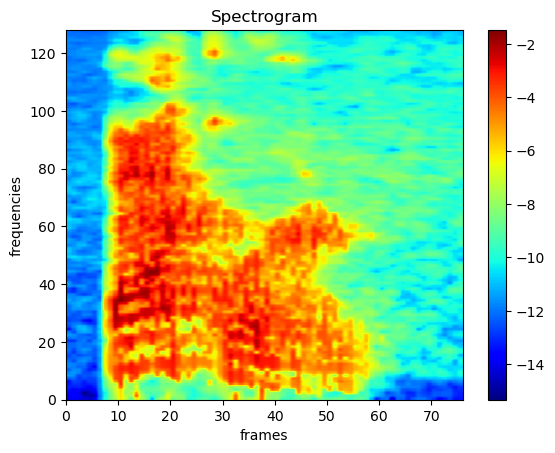

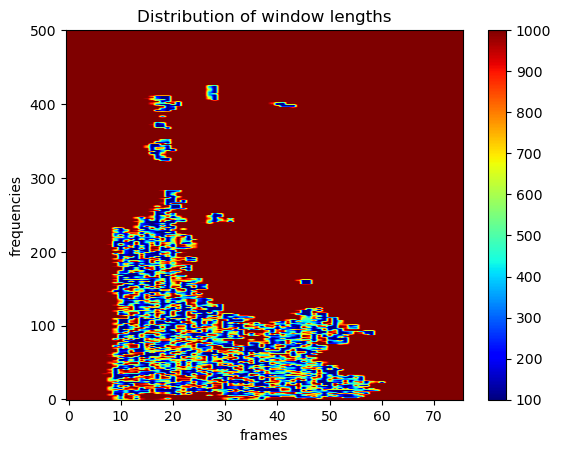

In [17]:
dstft = DSTFT(x, win_length=1_000, support=1_000, stride=200, win_requires_grad=True, stride_requires_grad=False, win_p='tf', win_min=100)
params = [{'params': dstft.win_length, 'lr': 100.0},  ] 
opt = torch.optim.Adam(params)
sch = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, mode='min', factor=.1, patience=99, verbose=True)

for epoch in range(1_000):
    opt.zero_grad()
    spec, *_ = dstft(x)
    spec = melscale_transform(spec)
    err = 1_000 / spec.sum() + 0.01 * (dstft.actual_win_length.diff(dim=0)[:, :-1].pow(2) + dstft.actual_win_length.diff(dim=1)[:-1].pow(2) + torch.finfo(x.dtype).eps).sqrt().mean()
    err.backward()
    opt.step()
    sch.step(err)
    
    if opt.param_groups[0]['lr'] < 1:
        break
    
print(epoch)
dstft.print(spec, x, bar=True, wins=False)

Epoch 00221: reducing learning rate of group 0 to 1.0000e+01.
Epoch 00321: reducing learning rate of group 0 to 1.0000e+00.
Epoch 00421: reducing learning rate of group 0 to 1.0000e-01.
420


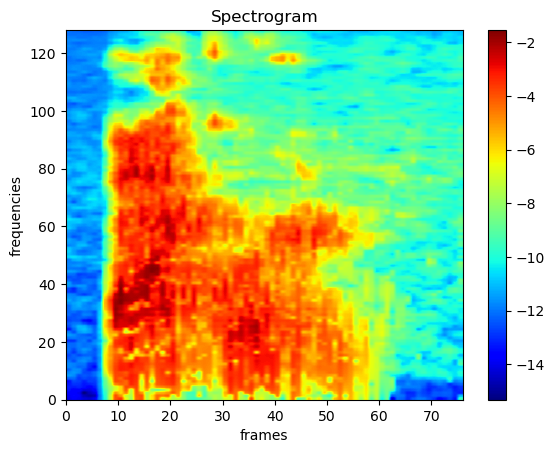

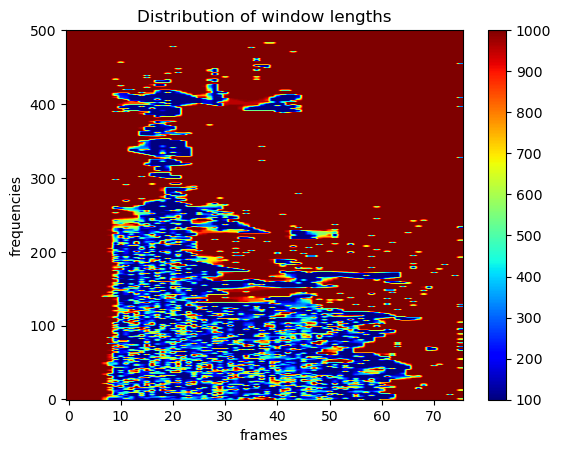

In [18]:
dstft = DSTFT(x, win_length=1_000, support=1_000, stride=200, win_requires_grad=True, stride_requires_grad=False, win_p='tf', win_min=100)
params = [{'params': dstft.win_length, 'lr': 100.0},  ] 
opt = torch.optim.Adam(params)
sch = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, mode='min', factor=.1, patience=99, verbose=True)

dstft.win_length.data = dstft.win_min + dstft.win_max * torch.rand(dstft.win_length.size(), device=dstft.win_length.device)

for epoch in range(1_000):
    opt.zero_grad()
    spec, *_ = dstft(x)
    spec = melscale_transform(spec)
    err = 1_000 / spec.sum() + 0.01 * (dstft.actual_win_length.diff(dim=0)[:, :-1].pow(2) + dstft.actual_win_length.diff(dim=1)[:-1].pow(2) + torch.finfo(x.dtype).eps).sqrt().mean()
    err.backward()
    opt.step()
    sch.step(err)
    
    if opt.param_groups[0]['lr'] < 1:
        break
    
print(epoch)
dstft.print(spec, x, bar=True, wins=False)

In [19]:
# dataset = YESNO(root='../../../data/raw', url='dev-clean', download=False)
# i = random.randint(0, len(dataset))
# x, sr, y = dataset[i]
# print(f'{y} | {i} | x.shape: {x.shape} | sample rate : {sr}')
# Audio(x, rate=sr)

In [2]:
dataset = LIBRISPEECH(root='../../../data/raw', url='dev-clean', folder_in_archive='LibriSpeech', download=False)
i = 837 #random.randint(0, len(dataset))
x, sr, y, speaker_id, chapter_id, utterance_id = dataset[i]
print(f'{y} \n{i} | x.shape: {x.shape} | sample rate : {sr} | speaker ID: {speaker_id} | utterance ID: {utterance_id}')
Audio(x, rate=sr)


A VOICE INQUIRED WHO'S THERE 
837 | x.shape: torch.Size([1, 43600]) | sample rate : 16000 | speaker ID: 2428 | utterance ID: 35


In [3]:
x =x.to(device)
figsize = (2.2*6.4, 4.8)

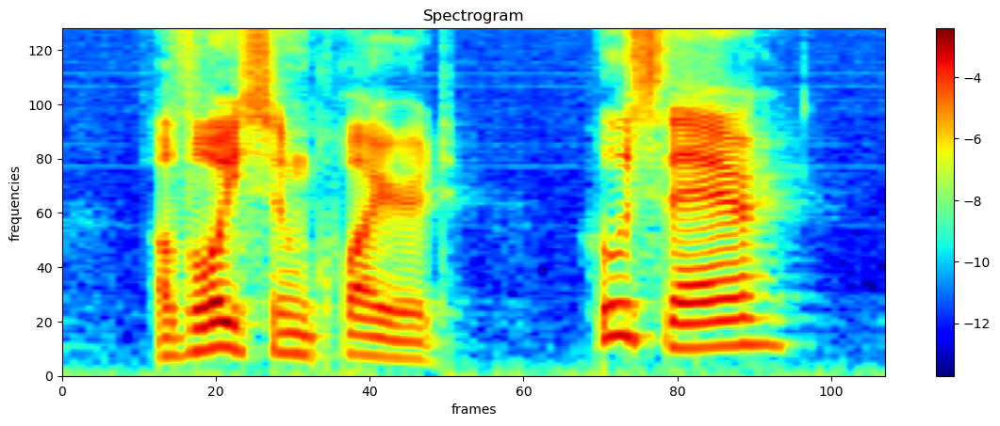

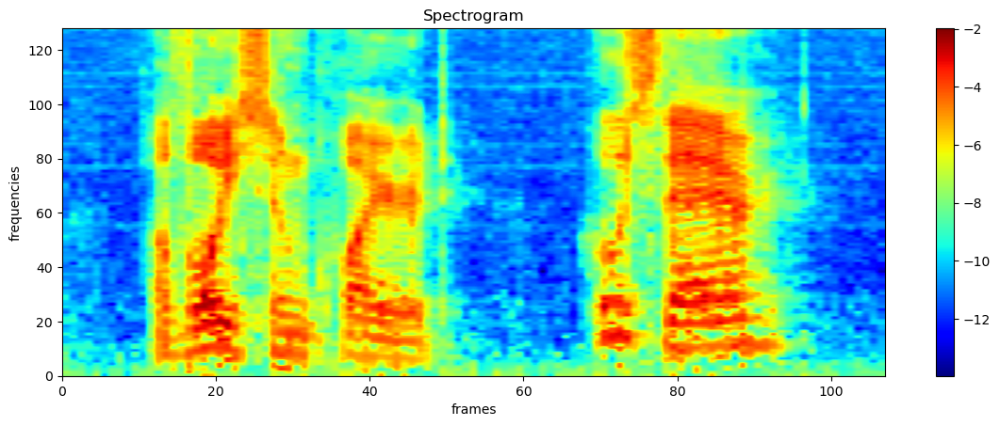

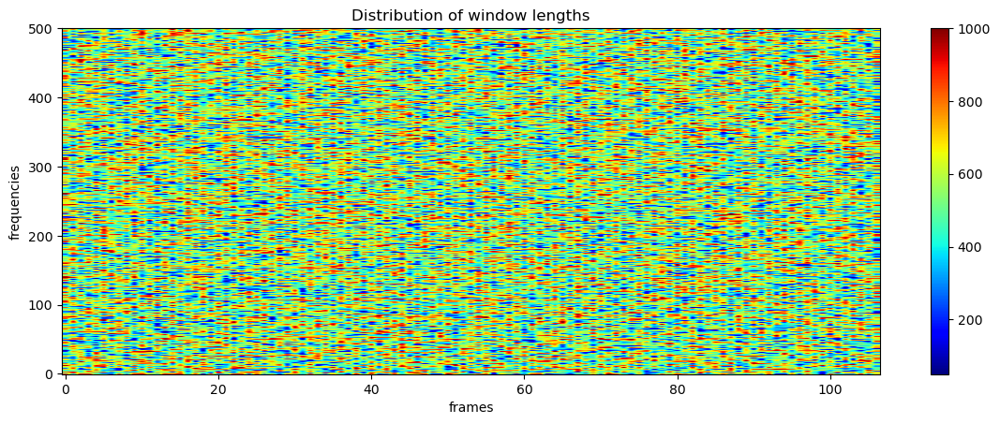

In [20]:
dstft = DSTFT(x, win_length=725, support=1_000, stride=400, win_requires_grad=False, stride_requires_grad=False, win_p='tf', stride_p=None, first_frame=True)
speca, *_ = dstft(x)
speca = melscale_transform(speca)
dstft.print(speca, x, weights=False, wins=False, bar=True, figsize=figsize)

dstft.win_length.data = dstft.win_min + dstft.win_max * torch.rand(dstft.win_length.size(), device=device)

spec, *_ = dstft(x)
spec = melscale_transform(spec)
dstft.print(spec, x, weights=True, bar=True, wins=False, figsize=figsize)

759 tensor(7.9848, device='cuda:0')


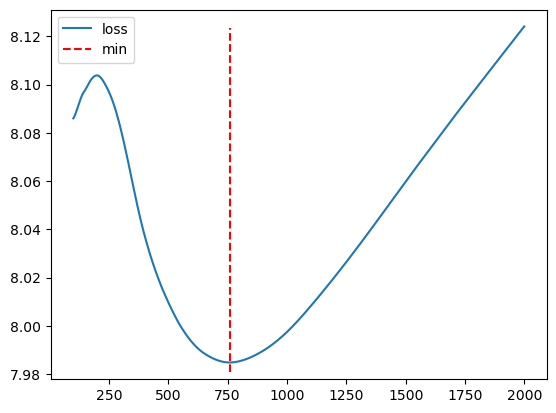

In [28]:
losses = []
min_err = 100
min_win = 0
support = 2_000
for win_length in range(100, support, 1):
    dstft = FDSTFT(x, win_length=win_length, support=support, stride=400, win_requires_grad=False, stride_requires_grad=False, win_p=None, stride_p=None)
    spec, *_ = dstft(x)
    spec = melscale_transform(spec)
    err = entropy_loss(spec)
    
    if err < min_err:
        min_err = err
        min_win = win_length
    losses.append(err.cpu())
    
print(min_win, min_err)

plt.plot(range(100, support, 1), losses, label='loss')
plt.axvline(x=min_win, ymin=0.02, ymax=0.95,  color='red', linestyle ='--', label='min')
#plt.axvline(x=100, ymin=0.02, ymax=0.95,  color='green', linestyle ='--', label='100')
#plt.axvline(x=support, ymin=0.02, ymax=0.95,  color='orange', linestyle ='--', label=support)
plt.legend()
plt.show()

980 tensor(17.8258, device='cuda:0')


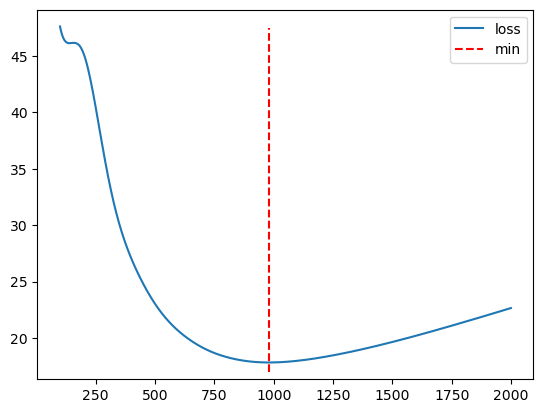

In [29]:
losses = []
min_err = 100
min_win = 0

for win_length in range(100, support, 1):
    dstft = FDSTFT(x, win_length=win_length, support=support, stride=400, win_requires_grad=False, stride_requires_grad=False, win_p=None, stride_p=None)
    spec, *_ = dstft(x)
    spec = melscale_transform(spec)
    err = 1_000 / kurtosis2_loss(spec)
    
    if err < min_err:
        min_err = err
        min_win = win_length
    losses.append(err.cpu())
    
print(min_win, min_err)

plt.plot(range(100, support, 1), losses, label='loss')
plt.axvline(x=min_win, ymin=0.02, ymax=0.95,  color='red', linestyle ='--', label='min')
#plt.axvline(x=100, ymin=0.02, ymax=0.95,  color='green', linestyle ='--', label='100')
#plt.axvline(x=support, ymin=0.02, ymax=0.95,  color='orange', linestyle ='--', label=support)
plt.legend()
plt.show()

100 tensor(12.8851, device='cuda:0')


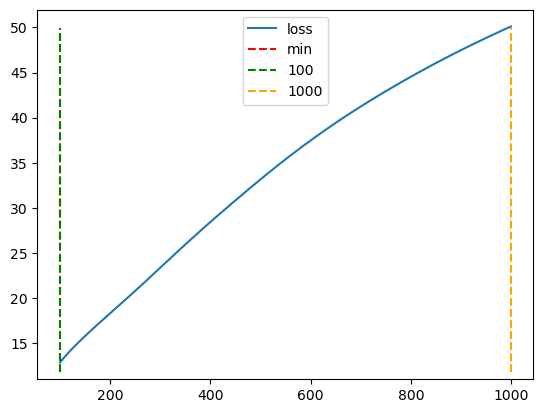

In [12]:
losses = []
min_err = 100
min_win = 0

for win_length in range(100, 1000, 1):
    dstft = FDSTFT(x, win_length=win_length, support=1_500, stride=400, win_requires_grad=False, stride_requires_grad=False, win_p=None, stride_p=None)
    spec, *_ = dstft(x)
    spec = melscale_transform(spec)
    err = 1_000 / spec.sum()
    
    if err < min_err:
        min_err = err
        min_win = win_length
    losses.append(err.cpu())
    
print(min_win, min_err)

plt.plot(range(100, 1500, 1), losses, label='loss')
plt.axvline(x=min_win, ymin=0.02, ymax=0.95,  color='red', linestyle ='--', label='min')
plt.axvline(x=100, ymin=0.02, ymax=0.95,  color='green', linestyle ='--', label='100')
plt.axvline(x=1000, ymin=0.02, ymax=0.95,  color='orange', linestyle ='--', label='1000')
plt.legend(loc='upper center')
plt.show()

Epoch 00104: reducing learning rate of group 0 to 1.0000e+01.
Epoch 00204: reducing learning rate of group 0 to 1.0000e+00.
Epoch 00304: reducing learning rate of group 0 to 1.0000e-01.
303
735.6949462890625 tensor(10.1177, device='cuda:0', grad_fn=<MeanBackward0>)


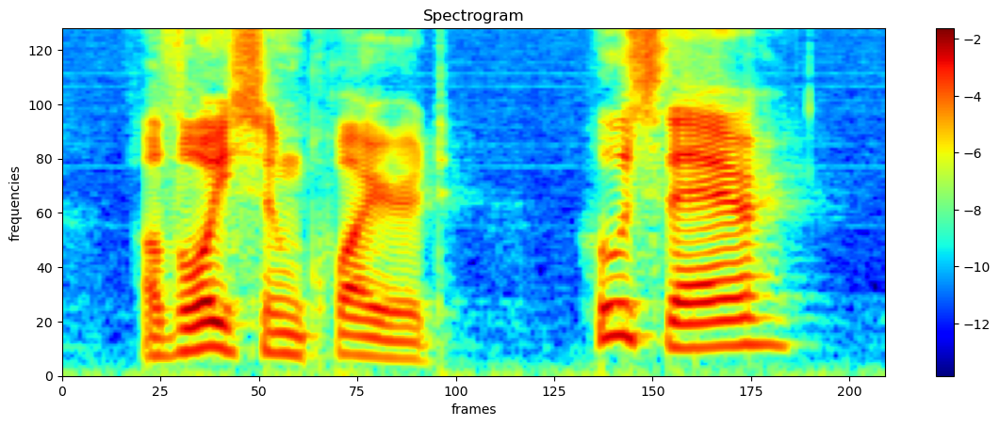

733.8


In [27]:
dstft = FDSTFT(x, win_length=1_000, support=2_000, stride=200, win_requires_grad=True, stride_requires_grad=False, win_p=None, stride_p=None)
params = [{'params': dstft.win_length,    'lr': 100.0}, ] 
opt = torch.optim.Adam(params)
sch = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, mode='min', factor=.1, patience=99, verbose=True)

min_err = 100
min_win = 0

for epoch in range(1_000):
    opt.zero_grad()    
    spec, *_ = dstft(x)
    err = entropy_loss(spec)
    spec = melscale_transform(spec)
    err.backward()    
    opt.step()
    sch.step(err)
    
    if err < min_err:
        min_err = err
        min_win = dstft.win_length.item()
    
    if opt.param_groups[0]['lr'] < 1:
        break
    
print(epoch)
print(min_win, min_err)
dstft.print(spec, x, bar=True, wins=False, weights=False, figsize=figsize)
print(f'{dstft.win_length.item():.1f}')

Epoch 00101: reducing learning rate of group 0 to 1.0000e+01.
Epoch 00201: reducing learning rate of group 0 to 1.0000e+00.
Epoch 00301: reducing learning rate of group 0 to 1.0000e-01.
300
992.3323974609375 tensor(18.0640, device='cuda:0', grad_fn=<MulBackward0>)


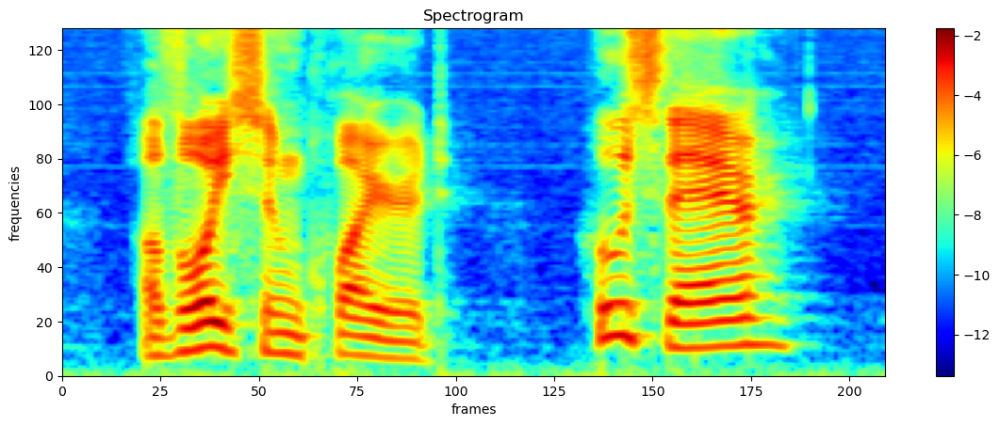

992.8


In [30]:
dstft = FDSTFT(x, win_length=1_000, support=2_000, stride=200, win_requires_grad=True, stride_requires_grad=False, win_p=None, stride_p=None, win_min=100)
params = [{'params': dstft.win_length,    'lr': 100.0}, ] 
opt = torch.optim.Adam(params)
sch = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, mode='min', factor=.1, patience=99, verbose=True)

min_err = 100
min_win = 0

for epoch in range(1_000):
    opt.zero_grad()    
    spec, *_ = dstft(x)
    spec = melscale_transform(spec)
    err = 1_000 / kurtosis2_loss(spec)
    err.backward()    
    opt.step()
    sch.step(err)
    
    if err < min_err:
        min_err = err
        min_win = dstft.win_length.item()
    
    if opt.param_groups[0]['lr'] < 1:
        break
    
print(epoch)
print(min_win, min_err)
dstft.print(spec, x, bar=True, wins=False, weights=False, figsize=figsize)
print(f'{dstft.win_length.item():.1f}')

Epoch 00110: reducing learning rate of group 0 to 1.0000e+01.
Epoch 00210: reducing learning rate of group 0 to 1.0000e+00.
Epoch 00310: reducing learning rate of group 0 to 1.0000e-01.
309
11.511886596679688 tensor(8.8845, device='cuda:0', grad_fn=<MulBackward0>)


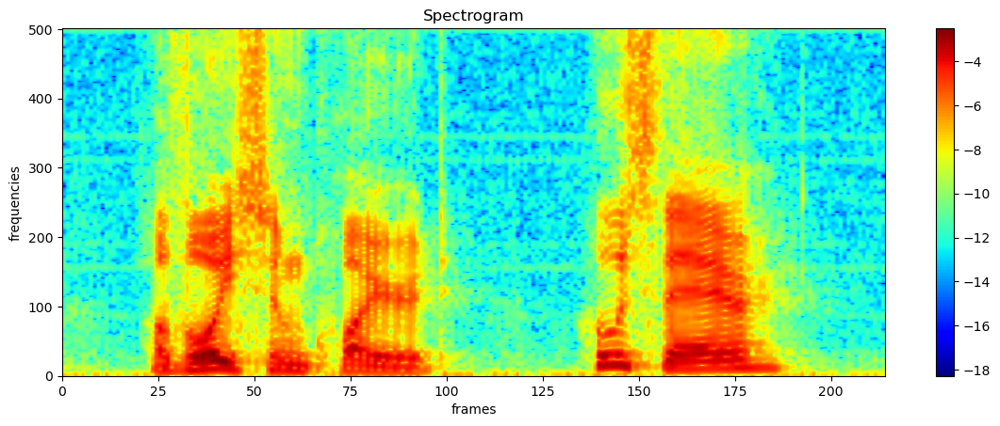

-873.3


In [29]:
dstft = FDSTFT(x, win_length=1_000, support=1_000, stride=200, win_requires_grad=True, stride_requires_grad=False, win_p=None, stride_p=None, win_min=200)
params = [{'params': dstft.win_length,    'lr': 100.0}, ] 
opt = torch.optim.Adam(params)
sch = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, mode='min', factor=.1, patience=99, verbose=True)

min_err = 100
min_win = 0

for epoch in range(1_000):
    opt.zero_grad()    
    spec, *_ = dstft(x)
    err = 1_000 / spec.sum()
    err.backward()    
    opt.step()
    sch.step(err)
    
    if err < min_err:
        min_err = err
        min_win = dstft.win_length.item()
    
    if opt.param_groups[0]['lr'] < 1:
        break
    
print(epoch)
print(min_win, min_err)
dstft.print(spec, x, bar=True, wins=False, weights=False, figsize=figsize)
print(f'{dstft.win_length.item():.1f}')

Epoch 00243: reducing learning rate of group 0 to 1.0000e+01.
Epoch 00343: reducing learning rate of group 0 to 1.0000e+00.
Epoch 00443: reducing learning rate of group 0 to 1.0000e-01.
Epoch 00543: reducing learning rate of group 0 to 1.0000e-02.
542


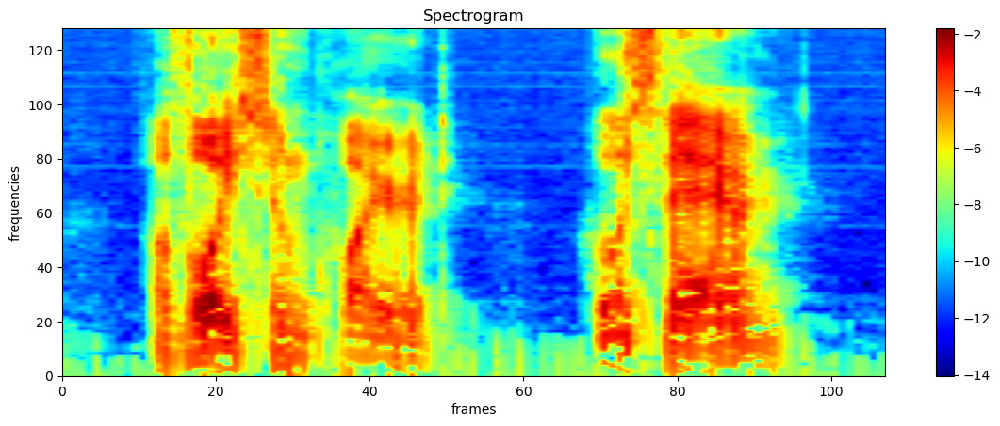

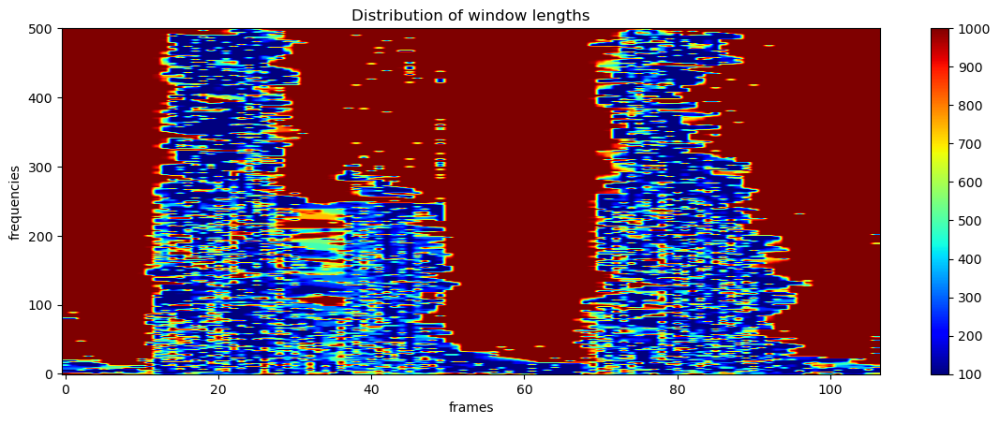

In [24]:
dstft = DSTFT(x, win_length=1_000, support=1_000, stride=400, win_requires_grad=True, stride_requires_grad=False, win_p='tf', win_min=100)
params = [{'params': dstft.win_length, 'lr': 100.0},  ] 
opt = torch.optim.Adam(params)
sch = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, mode='min', factor=.1, patience=99, verbose=True)

dstft.win_length.data = dstft.win_min + dstft.win_max * torch.rand(dstft.win_length.size(), device=dstft.win_length.device)

for epoch in range(1_000):
    opt.zero_grad()
    spec, *_ = dstft(x)
    spec = melscale_transform(spec)
    err = 1_000 / spec.sum() + 0.01 * (dstft.actual_win_length.diff(dim=0)[:, :-1].pow(2) + dstft.actual_win_length.diff(dim=1)[:-1].pow(2) + torch.finfo(x.dtype).eps).sqrt().mean()
    err.backward()
    opt.step()
    sch.step(err)
    
    if opt.param_groups[0]['lr'] < .1:
        break
    
print(epoch)
dstft.print(spec, x, bar=True, wins=False, figsize=figsize)

Epoch 00176: reducing learning rate of group 0 to 1.0000e+01.
Epoch 00279: reducing learning rate of group 0 to 1.0000e+00.
Epoch 00379: reducing learning rate of group 0 to 1.0000e-01.
378


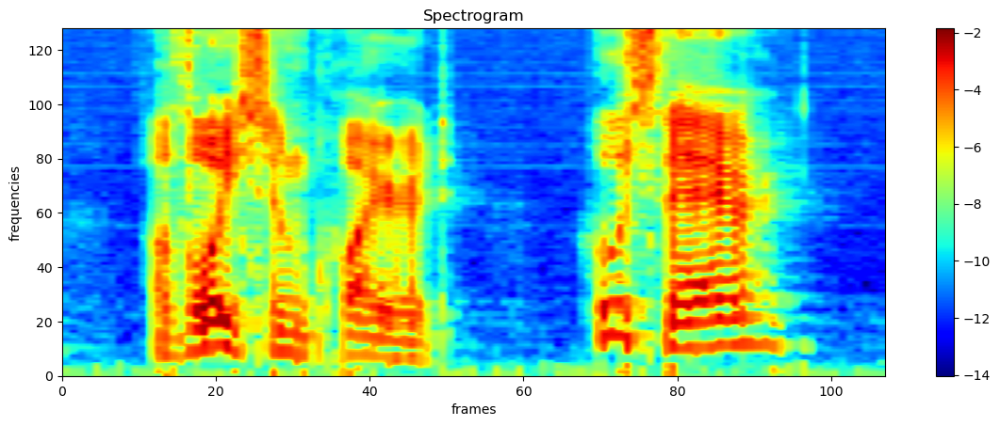

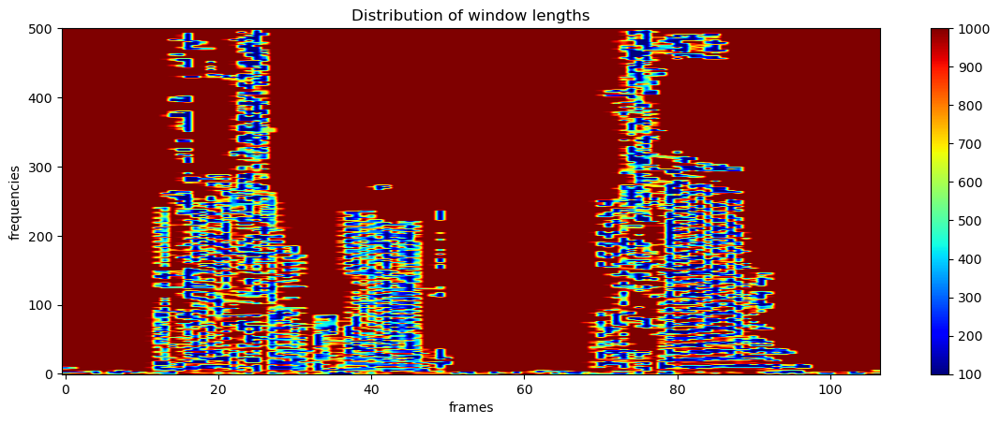

In [33]:
dstft = DSTFT(x, win_length=1_000, support=1_000, stride=400, win_requires_grad=True, stride_requires_grad=False, win_p='tf', win_min=100)
params = [{'params': dstft.win_length, 'lr': 100.0},  ] 
opt = torch.optim.Adam(params)
sch = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, mode='min', factor=.1, patience=99, verbose=True)


for epoch in range(1_000):
    opt.zero_grad()
    spec, *_ = dstft(x)
    spec = melscale_transform(spec)
    err = 1_000 / spec.sum() + 0.01 * (dstft.actual_win_length.diff(dim=0)[:, :-1].pow(2) + dstft.actual_win_length.diff(dim=1)[:-1].pow(2) + torch.finfo(x.dtype).eps).sqrt().mean()
    err.backward()
    opt.step()
    sch.step(err)
    
    if opt.param_groups[0]['lr'] < 1:
        break
    
print(epoch)
dstft.print(spec, x, bar=True, wins=False, figsize=figsize)

Epoch 00175: reducing learning rate of group 0 to 1.0000e+01.
Epoch 00275: reducing learning rate of group 0 to 1.0000e+00.
Epoch 00375: reducing learning rate of group 0 to 1.0000e-01.
374


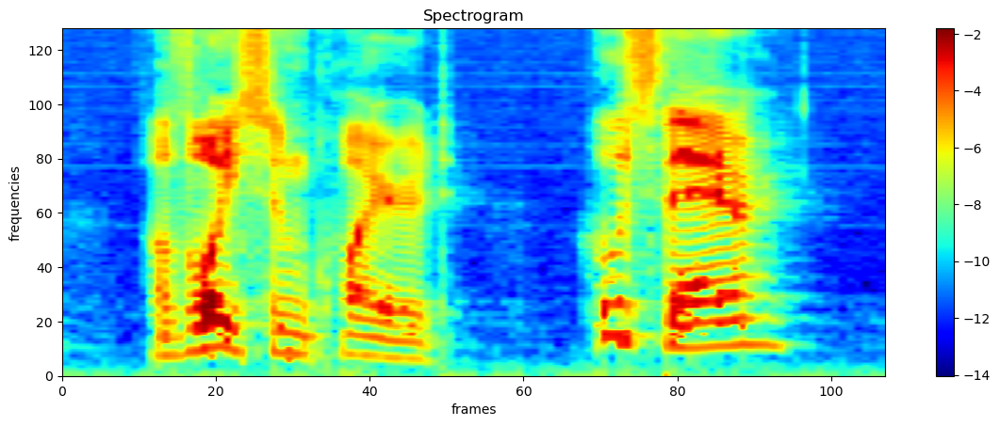

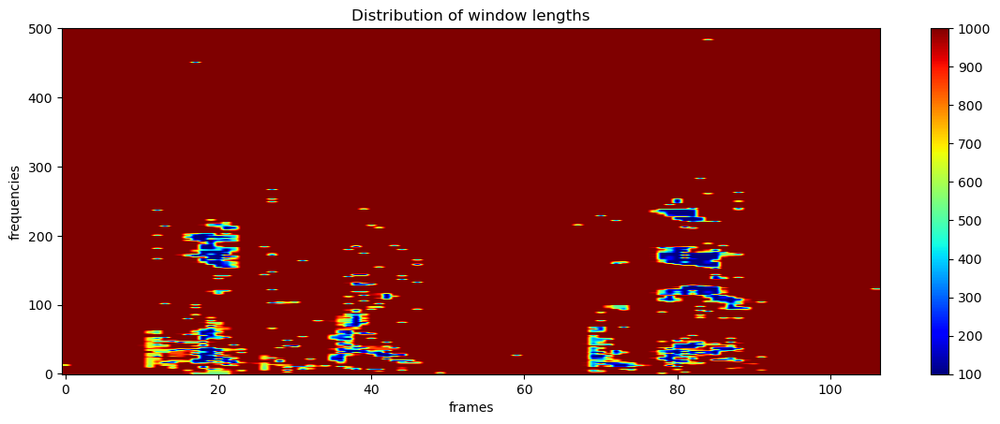

In [15]:
dstft = DSTFT(x, win_length=1_000, support=1_000, stride=400, win_requires_grad=True, stride_requires_grad=False, win_p='tf', win_min=100)
params = [{'params': dstft.win_length, 'lr': 100.0},  ] 
opt = torch.optim.Adam(params)
sch = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, mode='min', factor=.1, patience=99, verbose=True)

dstft.win_length.data = dstft.win_min + dstft.win_max * torch.rand(dstft.win_length.size(), device=dstft.win_length.device)

for epoch in range(1_000):
    opt.zero_grad()
    spec, *_ = dstft(x)
    spec = melscale_transform(spec)
    err = entropy_loss(spec) + 0.01 * (dstft.actual_win_length.diff(dim=0)[:, :-1].pow(2) + dstft.actual_win_length.diff(dim=1)[:-1].pow(2) + torch.finfo(x.dtype).eps).sqrt().mean()
    err.backward()
    opt.step()
    sch.step(err)
    
    if opt.param_groups[0]['lr'] < 1:
        break
    
print(epoch)
dstft.print(spec, x, bar=True, wins=False, figsize=figsize)

Epoch 00153: reducing learning rate of group 0 to 1.0000e+01.
Epoch 00253: reducing learning rate of group 0 to 1.0000e+00.
Epoch 00353: reducing learning rate of group 0 to 1.0000e-01.
352


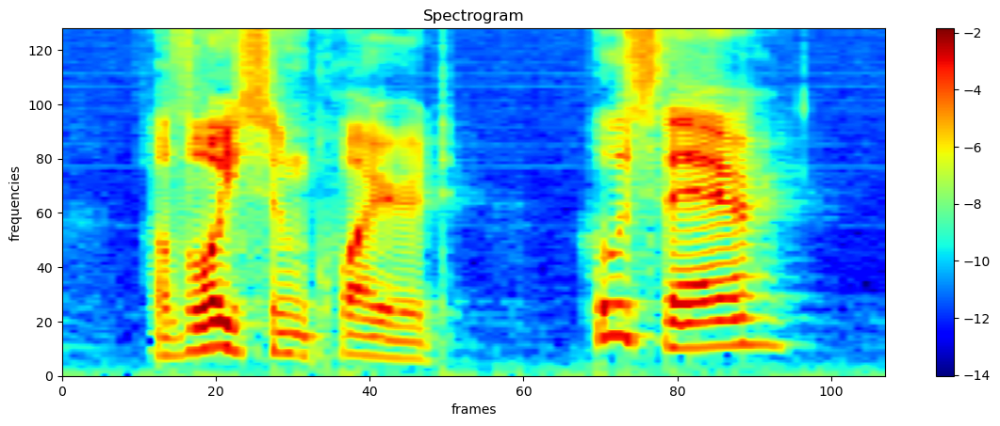

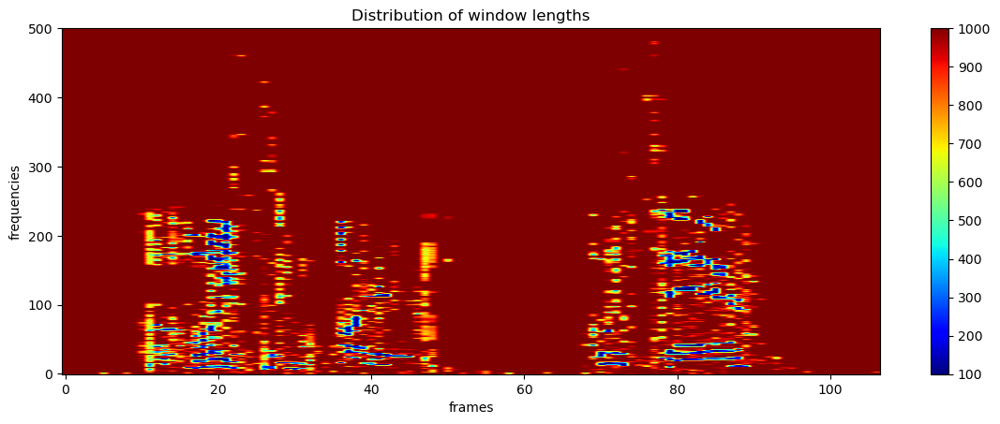

In [16]:
dstft = DSTFT(x, win_length=1_000, support=1_000, stride=400, win_requires_grad=True, stride_requires_grad=False, win_p='tf', win_min=100)
params = [{'params': dstft.win_length, 'lr': 100.0},  ] 
opt = torch.optim.Adam(params)
sch = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, mode='min', factor=.1, patience=99, verbose=True)

for epoch in range(1_000):
    opt.zero_grad()
    spec, *_ = dstft(x)
    spec = melscale_transform(spec)
    err = entropy_loss(spec) + 0.001 * (dstft.actual_win_length.diff(dim=0)[:, :-1].pow(2) + dstft.actual_win_length.diff(dim=1)[:-1].pow(2) + torch.finfo(x.dtype).eps).sqrt().mean()
    err.backward()
    opt.step()
    sch.step(err)
    
    if opt.param_groups[0]['lr'] < 1:
        break
    
print(epoch)
dstft.print(spec, x, bar=True, wins=False, figsize=figsize)

Epoch 00452: reducing learning rate of group 0 to 1.0000e+01.
Epoch 00552: reducing learning rate of group 0 to 1.0000e+00.
Epoch 00652: reducing learning rate of group 0 to 1.0000e-01.
651


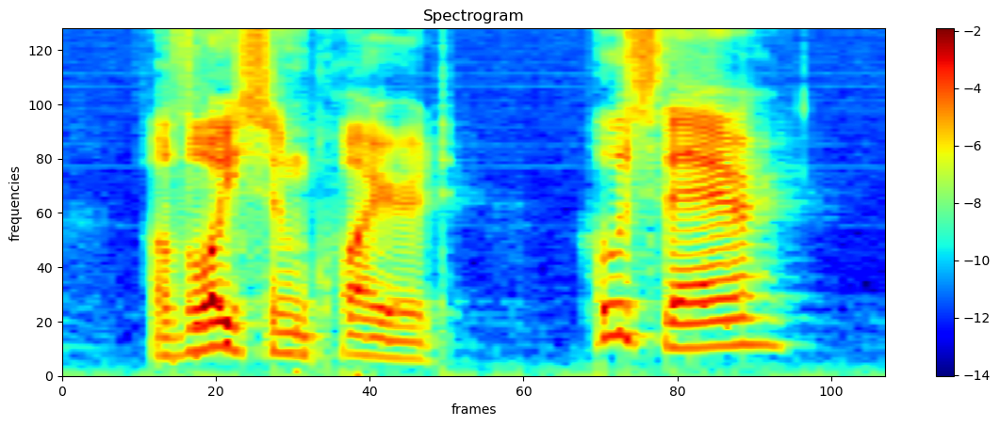

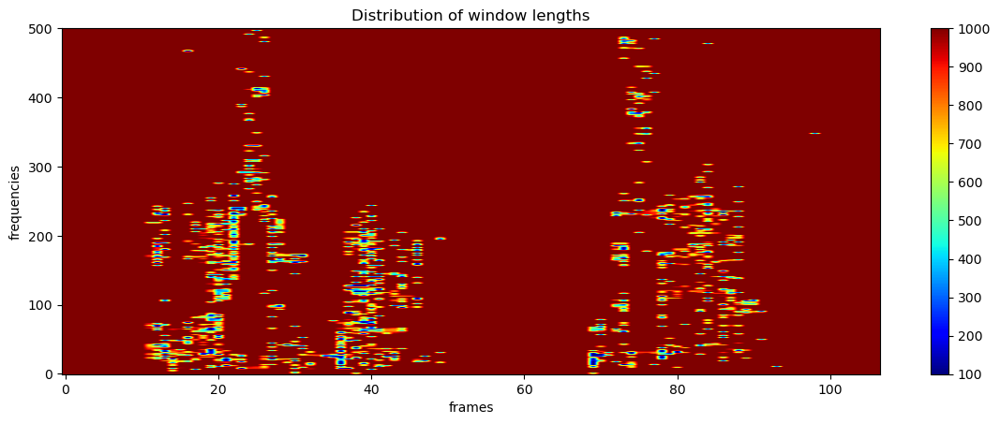

In [19]:
dstft = DSTFT(x, win_length=1_000, support=1_000, stride=400, win_requires_grad=True, stride_requires_grad=False, win_p='tf', win_min=100)
params = [{'params': dstft.win_length, 'lr': 100.0},  ] 
opt = torch.optim.Adam(params)
sch = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, mode='min', factor=.1, patience=99, verbose=True)

dstft.win_length.data = dstft.win_min + dstft.win_max * torch.rand(dstft.win_length.size(), device=dstft.win_length.device)

for epoch in range(1_000):
    opt.zero_grad()
    spec, *_ = dstft(x)
    spec = melscale_transform(spec)
    err = 1_000 / kurtosis2_loss(spec) + 0.01 * (dstft.actual_win_length.diff(dim=0)[:, :-1].pow(2) + dstft.actual_win_length.diff(dim=1)[:-1].pow(2) + torch.finfo(x.dtype).eps).sqrt().mean()
    err.backward()
    opt.step()
    sch.step(err)
    
    if opt.param_groups[0]['lr'] < 1:
        break
    
print(epoch)
dstft.print(spec, x, bar=True, wins=False, figsize=figsize)

Epoch 00177: reducing learning rate of group 0 to 1.0000e+01.
Epoch 00277: reducing learning rate of group 0 to 1.0000e+00.
Epoch 00377: reducing learning rate of group 0 to 1.0000e-01.
376


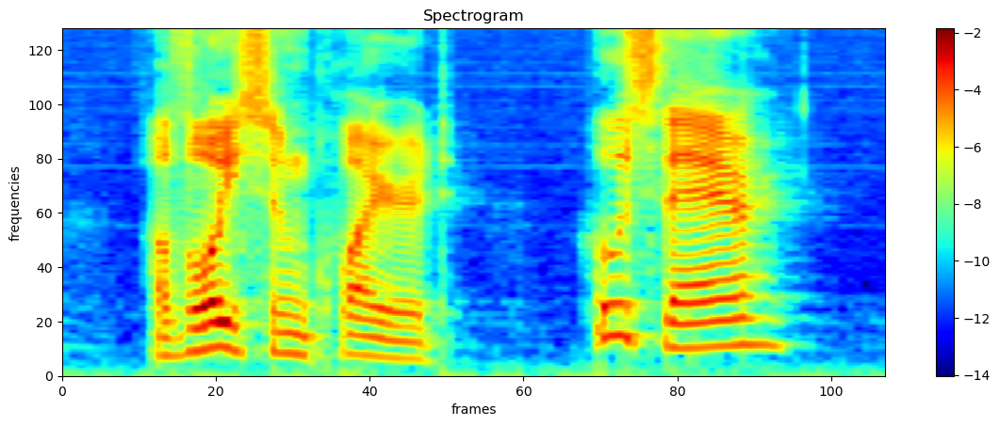

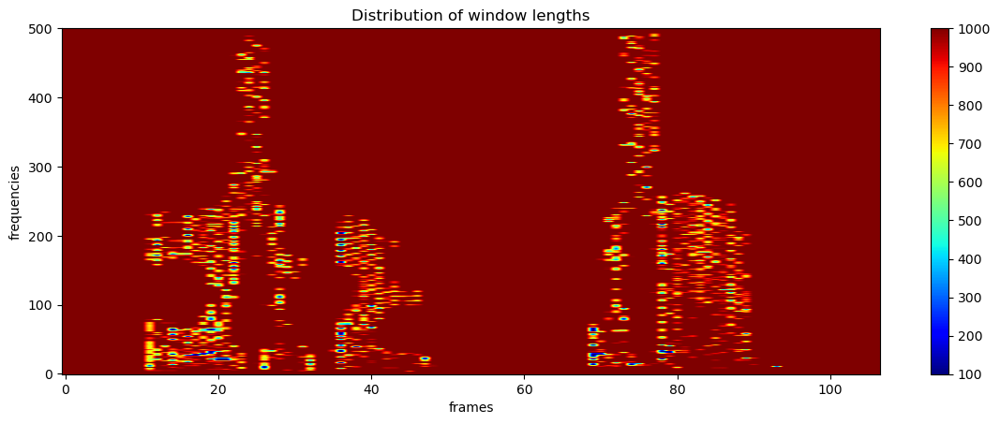

In [20]:
dstft = DSTFT(x, win_length=1_000, support=1_000, stride=400, win_requires_grad=True, stride_requires_grad=False, win_p='tf', win_min=100)
params = [{'params': dstft.win_length, 'lr': 100.0},  ] 
opt = torch.optim.Adam(params)
sch = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, mode='min', factor=.1, patience=99, verbose=True)

for epoch in range(1_000):
    opt.zero_grad()
    spec, *_ = dstft(x)
    spec = melscale_transform(spec)
    err = 1_000 / kurtosis2_loss(spec) + 0.001 * (dstft.actual_win_length.diff(dim=0)[:, :-1].pow(2) + dstft.actual_win_length.diff(dim=1)[:-1].pow(2) + torch.finfo(x.dtype).eps).sqrt().mean()
    err.backward()
    opt.step()
    sch.step(err)
    
    if opt.param_groups[0]['lr'] < 1:
        break
    
print(epoch)
dstft.print(spec, x, bar=True, wins=False, figsize=figsize)